<a href="https://colab.research.google.com/github/properallan/IM458-B/blob/master/twoPhaseFlow/PINN_tpf.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!apt install subversion
!svn checkout https://github.com/properallan/IM458-B/trunk/twoPhaseFlow
%cd ./twoPhaseFlow

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  libapr1 libaprutil1 libserf-1-1 libsvn1
Suggested packages:
  db5.3-util libapache2-mod-svn subversion-tools
The following NEW packages will be installed:
  libapr1 libaprutil1 libserf-1-1 libsvn1 subversion
0 upgraded, 5 newly installed, 0 to remove and 49 not upgraded.
Need to get 2,235 kB of archives.
After this operation, 9,916 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 libapr1 amd64 1.6.3-2 [90.9 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 libaprutil1 amd64 1.6.1-2 [84.4 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libserf-1-1 amd64 1.3.9-6 [44.4 kB]
Get:4 http://archive.ubuntu.com/ubuntu bionic-updates/unive

# Physics Informed Neural Networks - Two Phase Flow



In [ ]:
# Install deepxde to run in colab
!pip install deepxde 

In [ ]:
# Dependencies
import deepxde as dde
import numpy as np
import sys
import twoPhaseFlow as tpf
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib import rc
import os

Using backend: tensorflow.compat.v1

2022-07-05 19:25:03.609129: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/ThirdParty-9/platforms/linux64Gcc/gperftools-svn/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/paraview-5.6:/opt/paraviewopenfoam56/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/openmpi-system:/opt/ThirdParty-9/platforms/linux64GccDPInt32/lib/openmpi-system:/usr/lib/x86_64-linux-gnu/openmpi/lib:/home/ppiper/OpenFOAM/ppiper-9/platforms/linux64GccDPInt32Opt/lib:/opt/site/9/platforms/linux64GccDPInt32Opt/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib:/opt/ThirdParty-9/platforms/linux64GccDPInt32/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/dummy
2022-07-05 19:25:03.609160: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a

Instructions for updating:
non-resource variables are not supported in the long term



We start by defining an abstract class for the PINN. This class has methods to set up a generic PINN using the DeepXDE module.

In [ ]:
class PINN(object):
    def __init__(self, path=None):
        self.path = path
        self.restorepath = None
        
    def setDomain(self, x_domain, t_domain):
        self.x_domain = x_domain
        self.t_domain = t_domain
        self.geom = dde.geometry.Interval(*x_domain)
        self.timedomain = dde.geometry.TimeDomain(*t_domain)
        self.geomtime = dde.geometry.GeometryXTime(self.geom, self.timedomain)
        
    def setCollocation(self, N_domain, N_boundary, N_initial):
        self.N_domain = N_domain
        self.N_boundary = N_boundary
        self.N_initial = N_initial

    def setTopology(self, NN_layers, NN_activation, NN_init):
        self.NN_layers = NN_layers
        self.NN_activation = NN_activation
        self.NN_init = NN_init

    def setOpt(self, NN_optimizers, NN_lr, NN_epochs):
        self.NN_optimizers = NN_optimizers
        self.NN_lr = NN_lr
        self.NN_epochs = NN_epochs

    def train(self, restorepath=None): 
        self.setModel()

        l = self.NN_optimizers.__len__()-1
        for i, (opt, lr, epoch) in enumerate(zip(self.NN_optimizers, self.NN_lr, self.NN_epochs)):
            self.model.compile(opt, lr=lr)
            if restorepath is not None:
                self.load(restorepath)
            if i == l:
                self.losshistory, self.train_state = self.model.train(epochs=epoch, model_save_path=self.path)
            else:
                self.model.train(epochs=epoch, model_save_path=self.path)

    def setModel(self, loadpath=None):
        self.setICBC()
        self.data = dde.data.TimePDE(
            self.geomtime, 
            self.pde, 
            self.icbc,
            num_domain=self.N_domain, 
            num_boundary=self.N_boundary, 
            num_initial=self.N_initial
        )
        self.net = dde.nn.FNN(self.NN_layers, self.NN_activation, self.NN_init)

        self.model = dde.Model(self.data, self.net)

    def save(self, path):
        self.model.save(path)

    def load(self, path):
        if self.restorepath != path:
            self.restorepath = path
            self.model.restore(path)

Now, we define a children class for the Two Phase Flow PINN.

In [ ]:
class tpfPINN(PINN):  
    def __init__(self, path):
        PINN.__init__(self, path)
        self.M = 0
    def setFlux(self, flux):
        self.flux = flux

    def setEps(self, eps):
        self.eps = eps

    def setM(self, M):
        self.M = M
    
    def setICBC(self):
        self.ic = dde.icbc.IC(
            self.geomtime, 
            lambda x: np.zeros_like(x[:,0:1]), 
            lambda x, 
            on_initial: on_initial
            )

        self.bc = dde.icbc.DirichletBC(
            self.geomtime, 
            lambda x: 1, 
            lambda x, 
            on_boundary: on_boundary and np.isclose(x[0], self.x_domain[0])
        )
        self.icbc = [self.ic, self.bc]

    def pde(self, x, u):
        du_t = dde.grad.jacobian(u, x, i=0, j=1)
        df_u = dde.grad.jacobian(self.flux(u, self.M), u, i=0, j=0)
        du_x = dde.grad.jacobian(u, x, i=0, j=0)
        du_xx = dde.grad.hessian(u, x, i=0, j=0)
        return du_t + df_u*du_x - self.eps*du_xx

    def predict(self, Nx, Nt):
        self.x = np.linspace(self.x_domain[0], self.x_domain[-1], Nx)
        self.t = np.linspace(self.t_domain[0], self.t_domain[-1], Nt)
        self.X = spaceTimeDomain(self.x, self.t)
        self.u_pred = self.model.predict(self.X)
        self.u_pred = chunks(self.u_pred, Nx)
        self.u_pred = np.asarray(self.u_pred)[:,:,0]
        
        self.X, self.T = np.meshgrid(self.x, self.t)
        
        self.solve_exact(Nx, Nt)
        
        return self.u_pred

    def solve_exact(self, Nx, Nt):
        x = np.linspace(self.x_domain[0], self.x_domain[-1], Nx)
        t = np.linspace(self.t_domain[0], self.t_domain[-1], Nt)
        self.u_true = solve_exact(self.flux, x, t, self.M)
        self.u_true = chunks(self.u_true, Nx)
        self.u_true = np.asarray(self.u_true)[:,:,0]
        
        return self.u_true

    def animate(self):
        return  animate(self.X, self.u_true, self.u_pred, self.t)

    def plot(self, val, fig=None, ax=None):
        if fig is None and ax is None:
            fig, ax = plt.subplots()
        p = ax.pcolormesh(self.T,self.X, val, alpha=1)
        fig.colorbar(p)
        ax.set_ylabel(r'x')
        ax.set_xlabel(r't')

    def plotPred(self, fig=None, ax=None):
        self.plot(self.u_pred, fig, ax)
        ax = plt.gca()
        ax.set_title('PINN')

    def plotExact(self, fig=None, ax=None):
        self.plot(self.u_true, fig, ax)
        ax=plt.gca()
        ax.set_title('Exact')
        
    def plotNRSE(self, fig=None, ax=None):
        max = np.max(self.u_true)
        min = np.min(self.u_true)
        range = max - min
        val = ((self.u_pred-self.u_true)**2)**0.5/range
        self.plot(val, fig, ax)    
        ax=plt.gca()
        ax.set_title('NRSE')

    def ploti(self, i, fig=None, ax=None):
        if fig is None and ax is None:
            fig, ax = plt.subplots()
        ax.set_title(r't={:.2f}'.format(self.t[i]))
        ax.plot(self.X[0,:], self.u_true[i], label='Exact')
        ax.plot(self.X[0,:], self.u_pred[i], label='PINN')
        ax.legend()
        ax.set_ylabel(r'u(x,t)')
        ax.set_xlabel(r'x')

The `setICBC` method define the initial condition `ic`, for this problem

$$
u(x,0) = 0
$$

, and also the boundary condition for $x=0$

$$
u(0,t) = 1
$$

The method `pde` defines the PDE for residual evaluation at the collocation points, for this problem

$$
u_t + F_u u_x - \epsilon u_xx
$$

, if $\epsilon$ introduces a small artificial viscosity to prevent strong gradients and discontinuous solutions. If $\epsilon=0$, the PDE fall back to the original inviscid transport equation.

Other methods just change the flux function $F$, the $\epsilon$ viscosity, the $M$ parameter for the ration of the fluids viscosities. The remaining methods are useful to solve the exact problem for results comparison and plotting.

Other functions where implemented to help data reshape and visualization.

In [ ]:
def solve_exact(f, x, t, M):
    if f == f_convex:
        f = tpf.u_convex
    elif f == f_concave:
        f = tpf.u_concave
    elif f == f_nonconvex:
        f = tpf.u_nonconvex
        
    u = tpf.u_solve(f, x, t, M)

    u = u.flatten()
    u = u.reshape((len(u),1))

    return u

def chunks(l, n):
    n = max(1, n)
    return [l[i:i+n] for i in range(0, len(l), n)]

def spaceTimeDomain(x, t):
    o = np.ones(len(x)*len(t))
    t = chunks_multiply(o, len(x), t)
    
    X = np.zeros_like(t)
    X = chunks_copy(X, len(x), x)
    X = np.stack((X, t), axis=1)
    return X

def chunks_multiply(l, n, t):
    n = max(1, n)
    for j,i in enumerate(range(0, len(l), n)): l[i:i+n]=l[i:i+n]*t[j] 
    return l

def chunks_copy(l, n, x):
    n = max(1, n)
    for i in range(0, len(l), n): l[i:i+n]=x
    return l

def animate(X, y_true, y_pred, t):
    rc('animation', html='jshtml')
    Nt = y_pred.shape[0]
    N = y_pred.shape[1]
    
    Xc = X

    y_truec = y_true
    y_predc = y_pred

    fig = plt.figure(figsize=(5,5))
    ax = plt.axes(xlim=(0.0,1.0),ylim=(0.0-0.05,1.0+0.05),xlabel=(r'x'),ylabel=(r'u(x,t)'))
    line = ax.plot([], [], lw=1)[0]
    line2 = ax.plot([], [], lw=1)[0]

    def init():
        line.set_data([], [])
        line2.set_data([], [])
        line.set_label('Exact')
        line2.set_label('PINN')
        legend = plt.legend()
        plt.close()
        return line,line2,legend

    def animate(i):
        ax.set_title(r't={:.2f}'.format(t[i]))
        line.set_data(Xc[0,:], y_truec[i,:])   
        line2.set_data(Xc[0,:], y_predc[i,:])
        return line,line2
    
    anim = animation.FuncAnimation(fig, animate, init_func=init, frames=Nt, interval=100, blit=True)
    plt.close()
    anim
    return anim

def allPlots(Nx, Nt, PINN, fname):
    u_pred = PINN.predict(Nx, Nt)
    u_true = PINN.solve_exact(Nx, Nt)
    
    format = '.png'
    
    PINN.plotExact()
    plt.savefig(fname+'_exact'+format)  
    plt.show() 
       
    PINN.plotPred()
    plt.savefig(fname+'_pred'+format)
    plt.show()
    PINN.plotNRSE()
    plt.savefig(fname+'_nrse'+format)
    plt.show()

    i = 10
    fig, ax =  plt.subplots(1,1,figsize=(5,5))
    PINN.ploti(i, fig, ax)
    plt.savefig('it_'+str(i)+'_'+fname+format)
    plt.show()

    i = 50
    fig, ax =  plt.subplots(1,1,figsize=(5,5))
    PINN.ploti(i, fig, ax)
    plt.savefig('it_'+str(i)+'_'+fname+format)
    plt.show()

    i = 90
    fig, ax =  plt.subplots(1,1,figsize=(5,5))
    PINN.ploti(i, fig, ax)
    plt.savefig('it_'+str(i)+'_'+fname+format)
    plt.show()

    anim_convex = PINN.animate()

    return anim_convex

def loadAll():
    os.chdir('./convex')
    convex_PINN.train('convexPINN-15000.ckpt')
    os.chdir('../')
    os.chdir('./concave')
    concave_PINN.train('concavePINN-15000.ckpt')
    os.chdir('../')
    os.chdir('./nonconvex')
    nonconvex_PINN.train('nonconvexPINN-15000.ckpt')
    os.chdir('../')
    
def loadAllEps():
    eps_convex_PINN.train('./eps_concave/eps_convexPINN-15000.ckpt')
    eps_concave_PINN.train('./eps_convex/eps_concavePINN-15000.ckpt')
    eps_nonconvex_PINN.train('./eps_nonconvex/eps_nonconvexPINN-15000.ckpt')

def trainAll():
    convex_PINN.train()
    concave_PINN.train()
    nonconvex_PINN.train()

def trainAllEps():
    eps_convex_PINN.train()
    eps_concave_PINN.train()
    eps_nonconvex_PINN.train()

Here we define the different flux funtions. The concave one:

$$
F(u)=\frac{u}{\left(u+\frac{(1-u)}{M}\right)}
$$

In [ ]:
def f_concave(u, M):
    return u/(u+(1-u)/M)

The convex:

$$
F(u)=u^2
$$

In [ ]:
def f_convex(u, M):
    return u**2

And the non-convex:

$$
F(u)=\frac{u^2}{\left(u^2+\frac{(1-u)^2}{M}\right)}
$$

In [ ]:
def f_nonconvex(u, M):
    return u**2.0/(u**2.0+(1.0-u)**2.0/M)

All Neural Network's attributes are set in `setPINN` function.

In [ ]:
def setPINN(savepath, flux, eps, M=0):
    PINN = tpfPINN(savepath)
    PINN.setM(M)
    PINN.setFlux(flux=flux)
    PINN.setEps(eps=eps)
    PINN.setDomain(x_domain=(0, 1), t_domain=(0, 1))
    PINN.setCollocation(N_domain=2560, N_boundary=80, N_initial=160)
    PINN.setTopology(NN_layers=[2]+[32]*3+[1], NN_activation='tanh', NN_init='Glorot normal')
    PINN.setOpt(NN_optimizers=['adam', 'L-BFGS'], NN_lr=[1e-3, None], NN_epochs=[10000, None])
    #PINN.setOpt(NN_optimizers=['adam'], NN_lr=[1e-3], NN_epochs=[15000])
    
    return PINN

At first lets instantiate a PINN for each flux functions using the ideal model $\epsilon=0$.

In [ ]:
concave_PINN = setPINN('./concave/concavePINN', f_concave, eps=0, M=2)
convex_PINN = setPINN('./convex/convexPINN', f_convex, eps=0)
nonconvex_PINN = setPINN('./nonconvex/nonconvexPINN', f_nonconvex, eps=0, M=1)

And then optimize the Neural Network weights.

In [ ]:
trainAll()

/home/ppiper/miniconda3/lib/python3.9/site-packages/skopt/sampler/sobol.py:246: UserWarning: The balance properties of Sobol' points require n to be a power of 2. 0 points have been previously generated, then: n=0+2562=2562. 
  warnings.warn("The balance properties of Sobol' points require "
/home/ppiper/miniconda3/lib/python3.9/site-packages/skopt/sampler/sobol.py:246: UserWarning: The balance properties of Sobol' points require n to be a power of 2. 0 points have been previously generated, then: n=0+82=82. 
  warnings.warn("The balance properties of Sobol' points require "
/home/ppiper/miniconda3/lib/python3.9/site-packages/skopt/sampler/sobol.py:246: UserWarning: The balance properties of Sobol' points require n to be a power of 2. 0 points have been previously generated, then: n=0+162=162. 
  warnings.warn("The balance properties of Sobol' points require "
/home/ppiper/miniconda3/lib/python3.9/site-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:103: UserWarning: `tf.layers.dense` 

Compiling model...
Building feed-forward neural network...
'build' took 0.119428 s



2022-07-05 19:25:12.233641: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-07-05 19:25:12.234671: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/ThirdParty-9/platforms/linux64Gcc/gperftools-svn/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/paraview-5.6:/opt/paraviewopenfoam56/lib:/opt/openfoam9/platforms/linux64GccDPInt32Opt/lib/openmpi-system:/opt/ThirdParty-9/platforms/linux64GccDPInt32/lib/openmpi-system:/usr/lib/x86_64-linux-gnu/openmpi/lib:/home/ppiper/OpenFOAM/ppiper-9/platforms/linux64GccDPInt32Opt/lib:/opt/site/9/platforms/linux64

'compile' took 1.043283 s

Initializing variables...
Training model...



2022-07-05 19:25:13.253712: W tensorflow/compiler/jit/mark_for_compilation_pass.cc:1658] (One-time warning): Not using XLA:CPU for cluster.

If you want XLA:CPU, do one of the following:

 - set the TF_XLA_FLAGS to include "--tf_xla_cpu_global_jit", or
 - set cpu_global_jit to true on this session's OptimizerOptions, or
 - use experimental_jit_scope, or
 - use tf.function(jit_compile=True).

To confirm that XLA is active, pass --vmodule=xla_compilation_cache=1 (as a
proper command-line flag, not via TF_XLA_FLAGS).


Step      Train loss                        Test loss                         Test metric
0         [5.71e-02, 6.69e-02, 9.72e-01]    [5.71e-02, 6.69e-02, 9.72e-01]    []  
1000      [3.79e-02, 5.38e-02, 3.21e-02]    [3.79e-02, 5.38e-02, 3.21e-02]    []  
2000      [3.27e-02, 5.06e-02, 3.03e-02]    [3.27e-02, 5.06e-02, 3.03e-02]    []  
3000      [3.12e-02, 4.91e-02, 2.94e-02]    [3.12e-02, 4.91e-02, 2.94e-02]    []  
4000      [3.03e-02, 4.84e-02, 2.94e-02]    [3.03e-02, 4.84e-02, 2.94e-02]    []  
5000      [3.05e-02, 4.74e-02, 2.89e-02]    [3.05e-02, 4.74e-02, 2.89e-02]    []  
6000      [3.08e-02, 4.59e-02, 2.77e-02]    [3.08e-02, 4.59e-02, 2.77e-02]    []  
7000      [2.91e-02, 4.52e-02, 2.80e-02]    [2.91e-02, 4.52e-02, 2.80e-02]    []  
8000      [2.85e-02, 4.54e-02, 2.73e-02]    [2.85e-02, 4.54e-02, 2.73e-02]    []  
9000      [3.08e-02, 4.33e-02, 2.86e-02]    [3.08e-02, 4.33e-02, 2.86e-02]    []  
10000     [2.92e-02, 4.39e-02, 2.66e-02]    [2.92e-02, 4.39e-02, 2.66e-02]    []

## Results for Concave Flux, $\epsilon=0$

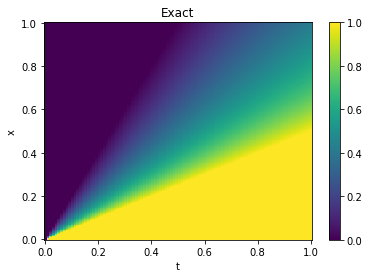

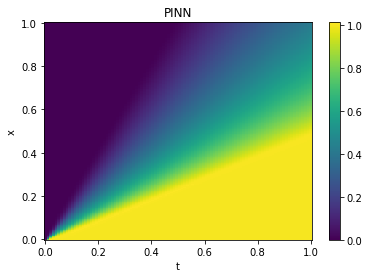

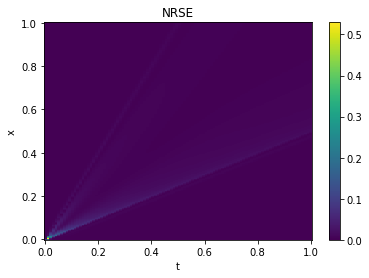

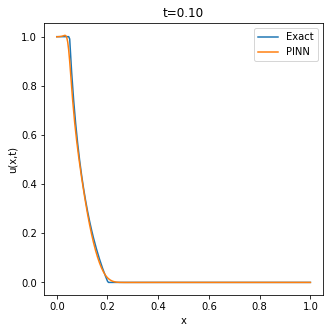

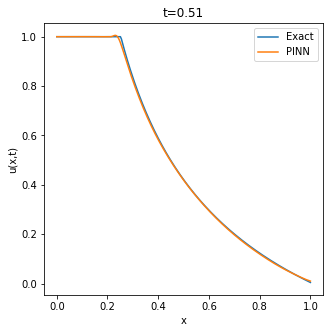

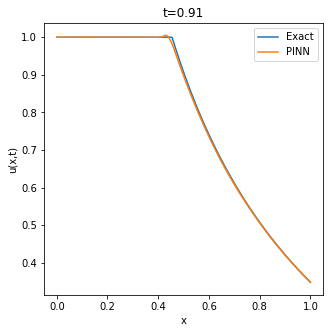

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [ ]:
Nx = 256
Nt = 100

anim_concave = allPlots(Nx, Nt, concave_PINN, 'concave')
anim_concave

## Results for Convex Flux, $\epsilon=0$

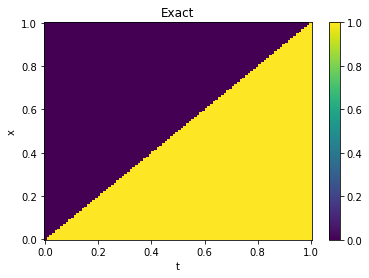

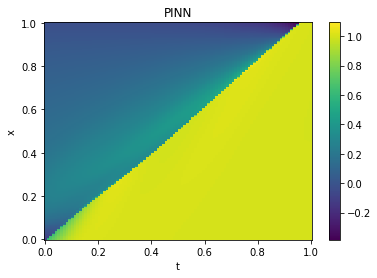

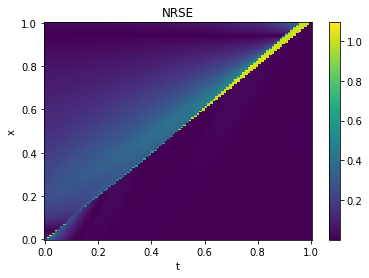

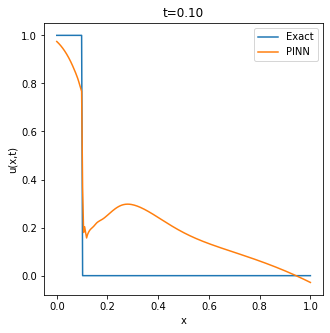

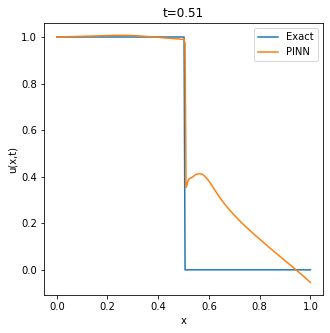

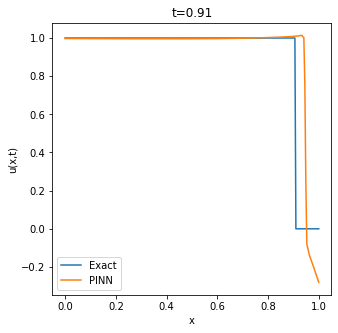

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [ ]:
anim_convex = allPlots(Nx, Nt, convex_PINN, 'convex')
anim_convex

## Results for Non-Convex Flux, $\epsilon=0$

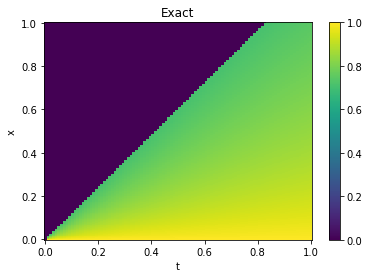

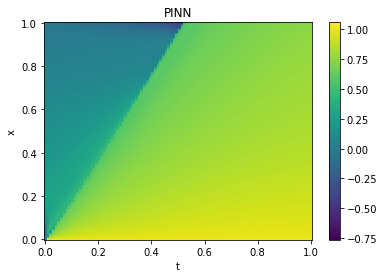

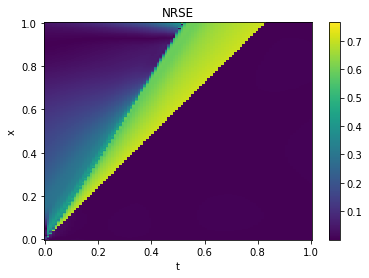

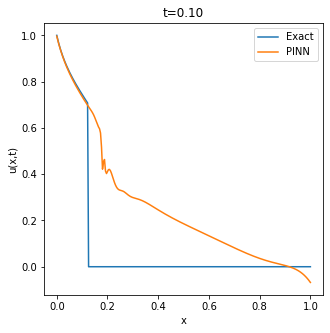

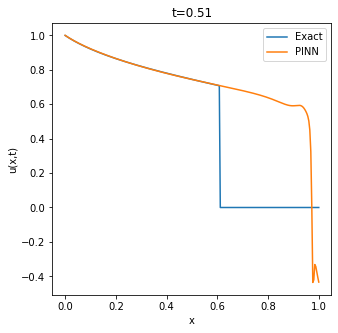

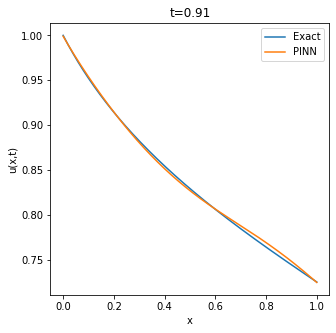

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [ ]:
anim_nonconvex = allPlots(Nx, Nt, nonconvex_PINN, 'nonconvex')
anim_nonconvex

# With Artificial viscosity

Now, the residual function is modified with a small artificial viscosity, $\epsilon=5\times10^{-3}$.

In [ ]:
eps_concave_PINN = setPINN('./eps_concave/eps_concavePINN', f_concave, eps=5e-3, M=2)
eps_convex_PINN = setPINN('./eps_convex/eps_convexPINN', f_convex, eps=5e-3)
eps_nonconvex_PINN = setPINN('./eps_nonconvex/eps_nonconvexPINN', f_nonconvex, eps=7e-3, M=1)

In [ ]:
trainAllEps()

Compiling model...
Building feed-forward neural network...
'build' took 0.058738 s



/home/ppiper/miniconda3/lib/python3.9/site-packages/skopt/sampler/sobol.py:246: UserWarning: The balance properties of Sobol' points require n to be a power of 2. 0 points have been previously generated, then: n=0+2562=2562. 
  warnings.warn("The balance properties of Sobol' points require "
/home/ppiper/miniconda3/lib/python3.9/site-packages/skopt/sampler/sobol.py:246: UserWarning: The balance properties of Sobol' points require n to be a power of 2. 0 points have been previously generated, then: n=0+82=82. 
  warnings.warn("The balance properties of Sobol' points require "
/home/ppiper/miniconda3/lib/python3.9/site-packages/skopt/sampler/sobol.py:246: UserWarning: The balance properties of Sobol' points require n to be a power of 2. 0 points have been previously generated, then: n=0+162=162. 
  warnings.warn("The balance properties of Sobol' points require "
/home/ppiper/miniconda3/lib/python3.9/site-packages/deepxde/nn/tensorflow_compat_v1/fnn.py:103: UserWarning: `tf.layers.dense` 

'compile' took 0.669070 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [8.50e-04, 1.08e-02, 1.02e+00]    [8.50e-04, 1.08e-02, 1.02e+00]    []  
1000      [2.75e-02, 3.38e-02, 2.47e-02]    [2.75e-02, 3.38e-02, 2.47e-02]    []  
2000      [2.87e-04, 2.93e-06, 4.75e-05]    [2.87e-04, 2.93e-06, 4.75e-05]    []  
3000      [1.20e-03, 2.17e-05, 2.84e-05]    [1.20e-03, 2.17e-05, 2.84e-05]    []  
4000      [2.93e-05, 8.87e-07, 5.47e-06]    [2.93e-05, 8.87e-07, 5.47e-06]    []  
5000      [1.98e-05, 8.00e-07, 3.86e-06]    [1.98e-05, 8.00e-07, 3.86e-06]    []  
6000      [4.38e-04, 2.09e-05, 9.16e-06]    [4.38e-04, 2.09e-05, 9.16e-06]    []  
7000      [1.35e-05, 2.15e-07, 2.33e-06]    [1.35e-05, 2.15e-07, 2.33e-06]    []  
8000      [2.75e-05, 5.52e-06, 5.22e-06]    [2.75e-05, 5.52e-06, 5.22e-06]    []  
9000      [1.08e-05, 2.44e-06, 2.52e-06]    [1.08e-05, 2.44e-06, 2.52e-06]    []  
10000   

## Results for Concave Flux

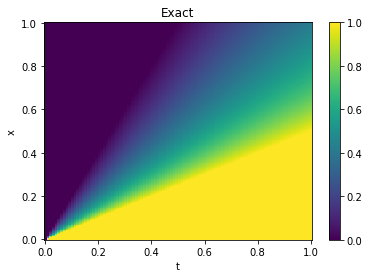

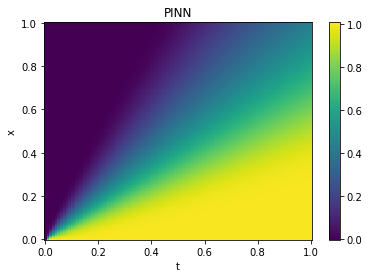

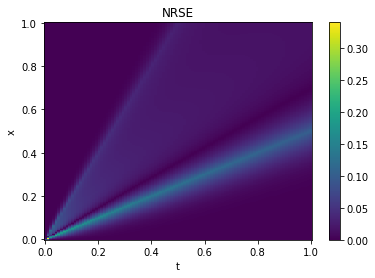

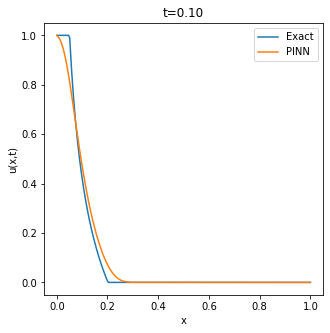

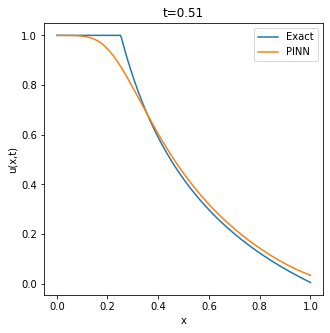

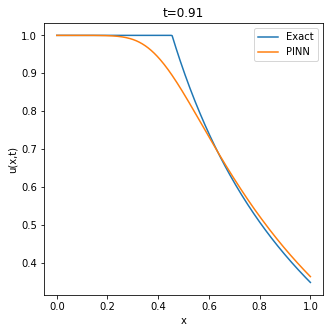

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [ ]:
Nx = 256
Nt = 100

eps_anim_concave = allPlots(Nx, Nt, eps_concave_PINN, 'eps_concave')
eps_anim_concave

## Results for Convex Flux

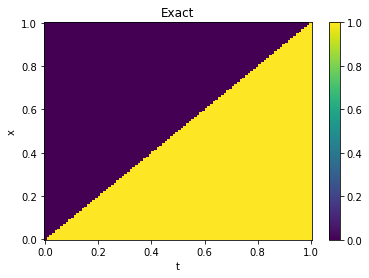

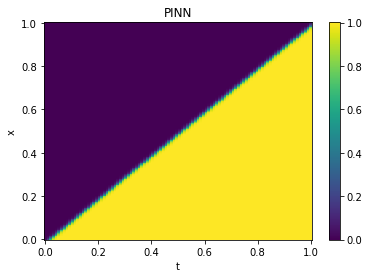

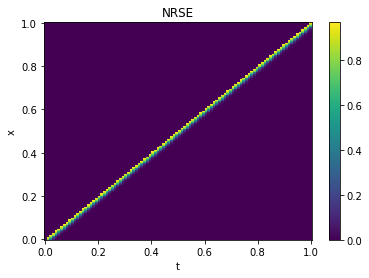

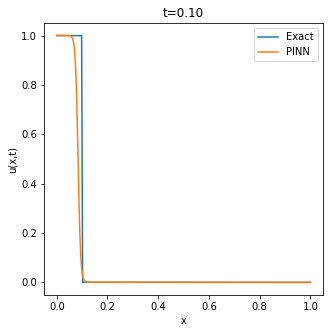

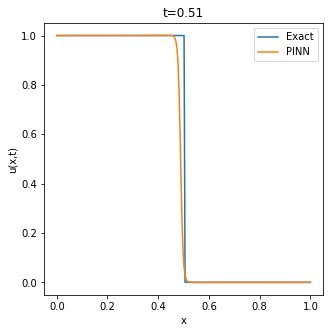

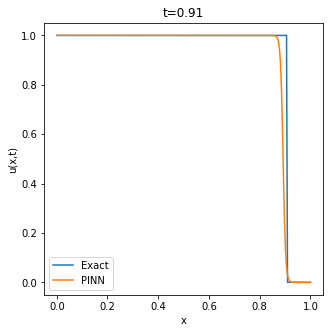

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [ ]:
eps_anim_convex = allPlots(Nx, Nt, eps_convex_PINN, 'eps_convex')
eps_anim_convex

## Results for Non-Convex Flux

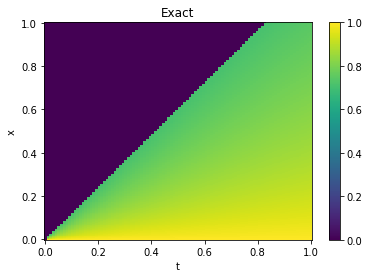

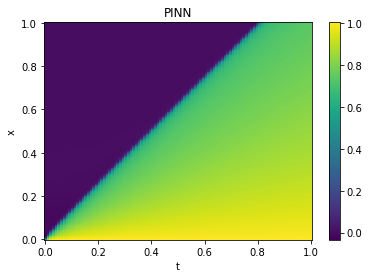

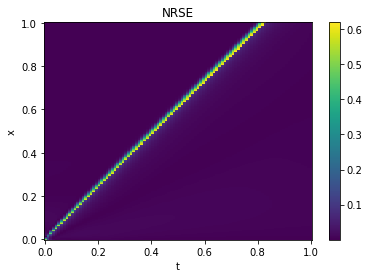

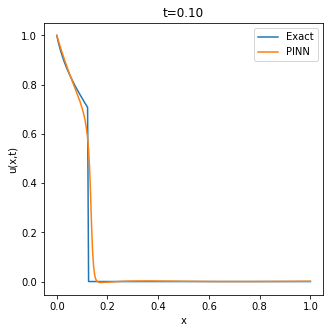

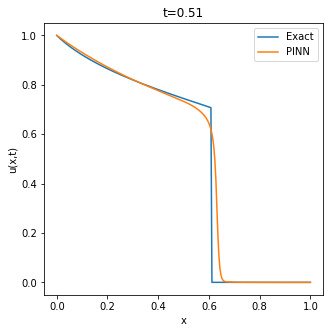

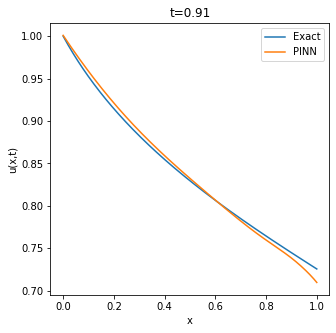

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


In [ ]:
eps_anim_nonconvex = allPlots(Nx, Nt, eps_nonconvex_PINN, 'eps_nonconvex')
eps_anim_nonconvex